# Hough Transform detect line

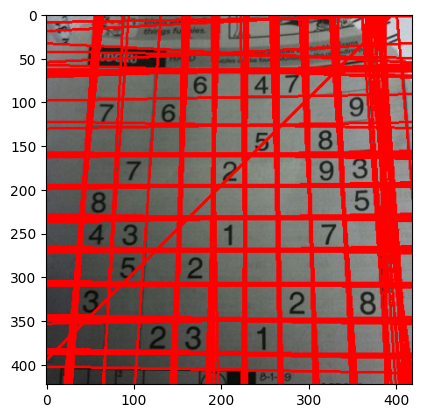

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread("images/sudoku.jpg")
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
edge = cv2.Canny(gray,50,150)
lines = cv2.HoughLines(edge,1,np.pi/180,120)
for line in lines:
    rho,theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))
    cv2.line(img,(x1,y1),(x2,y2),(0,0,255),2)
plt.imshow(img[...,::-1])

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread("images/highway-lanes.jpg",cv2.IMREAD_COLOR)
img = image.copy()
blur = cv2.GaussianBlur(img,(5,5),0)
gray = cv2.cvtColor(blur,cv2.COLOR_BGR2GRAY)
edge = cv2.Canny(gray,50,200)
lines = cv2.HoughLinesP(edge,1,np.pi/180,50,minLineLength=20,maxLineGap=50)
lines[0]

array([[[306,   9, 407, 227]],

       [[326,   3, 513, 291]],

       [[353,   2, 587, 262]],

       [[332,   0, 542, 299]],

       [[309,   0, 459, 294]],

       [[  0, 197, 162,   4]],

       [[353,   0, 587, 251]],

       [[300,   1, 418, 277]],

       [[ 27,  76, 117,   1]],

       [[310,   1, 424, 225]],

       [[ 46,  96, 141,   1]],

       [[445, 100, 584, 249]],

       [[  1, 185, 157,   5]],

       [[402, 219, 439, 299]],

       [[369,  16, 530, 189]],

       [[364,   9, 456, 108]],

       [[100, 265, 207,   1]],

       [[351, 119, 428, 300]],

       [[299,   0, 348, 115]],

       [[  2,  77, 104,   0]],

       [[254,   4, 265, 220]],

       [[515,   1, 586,  47]],

       [[445, 106, 573, 248]],

       [[  1, 197, 148,  22]],

       [[ 10,  72, 104,   1]],

       [[396,   2, 582, 152]],

       [[ 32, 150, 163,   0]],

       [[106, 267, 208,   2]],

       [[402, 111, 442, 168]],

       [[ 73, 105, 164,   1]],

       [[482,   1, 582,  49]],

       [

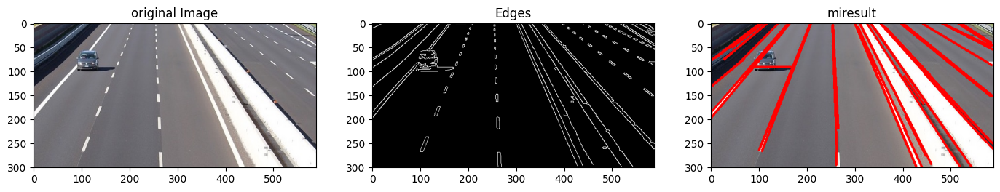

In [15]:
for line in lines:
    x1,y1,x2,y2 = line[0]
    cv2.line(img,(x1,y1),(x2,y2),(0,0,255),3) 
# Show result
plt.figure(figsize=[17,8])
plt.subplot(131);plt.imshow(image[...,::-1]);plt.title("original Image");
plt.subplot(132);plt.imshow(edge, cmap='gray');plt.title("Edges");
plt.subplot(133);plt.imshow(img[...,::-1], cmap='gray');plt.title("miresult");

https://docs.opencv.org/4.x/d6/d10/tutorial_py_houghlines.html

https://docs.opencv.org/3.4/d9/db0/tutorial_hough_lines.html

## clock

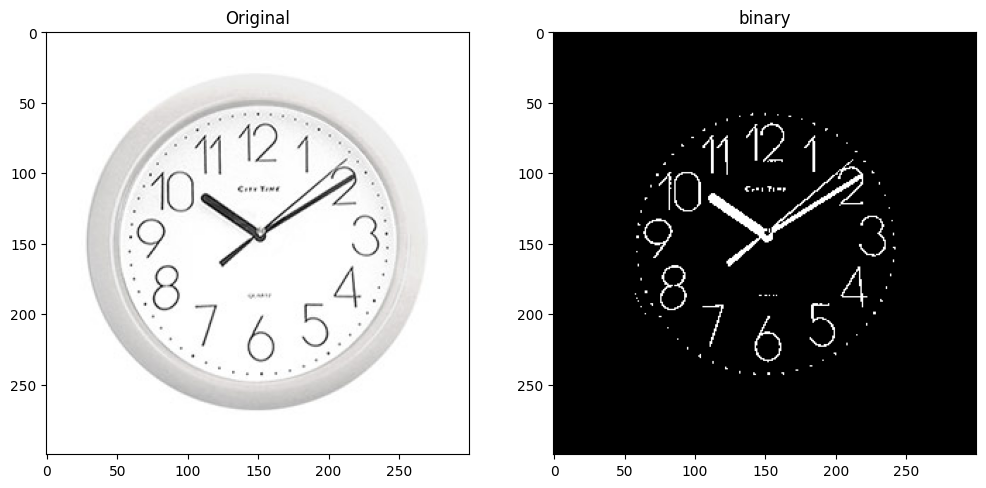

In [48]:
# Imports
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read image
image = cv2.imread("images/clock.jpg")
img = image.copy()

# Convert BGR back to grayscale:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Threshold via Otsu:
_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

plt.figure(figsize=[12,7])
plt.subplot(121);plt.imshow(image[...,::-1]);plt.title("Original");
plt.subplot(122);plt.imshow(binary, cmap='gray');plt.title("binary");

### <div style="direction:rtl;text-align:right;font-family:Tahoma">جهت یاداوری:
</div>

**Opening:**
$$dilate( erode( src, element ) )$$
<div style="direction:rtl;text-align:right;font-family:Tahoma">
مفید برای حذف اشیاء کوچک (فرض می شود که اشیاء در یک پیش زمینه تاریک روشن هستند)
</div>

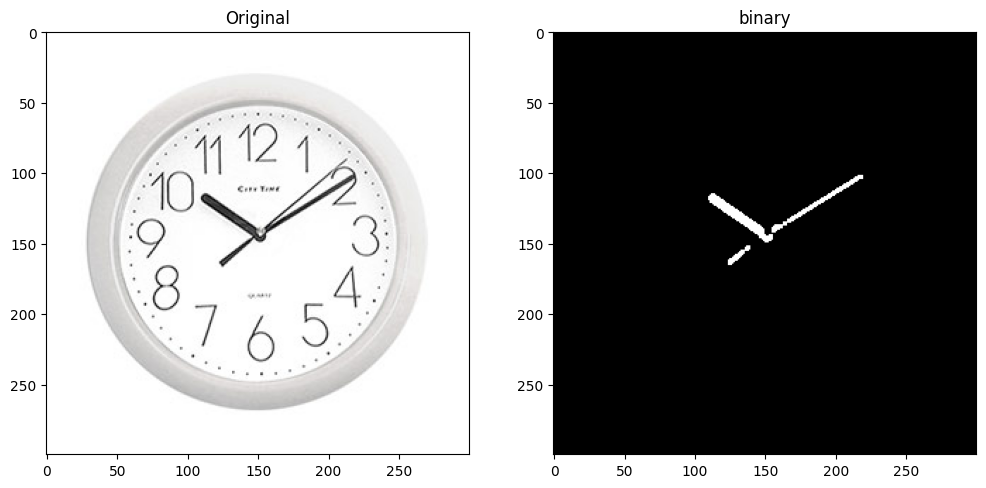

In [49]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))
morph = cv2.morphologyEx(binary,cv2.MORPH_OPEN,kernel,iterations=1)
plt.figure(figsize=[12,7])
plt.subplot(121);plt.imshow(image[...,::-1]);plt.title("Original");
plt.subplot(122);plt.imshow(morph, cmap='gray');plt.title("binary");

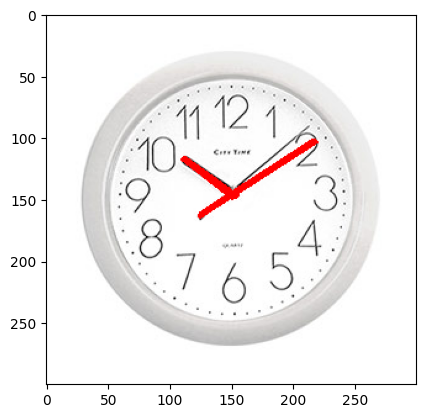

In [50]:
# Set HoughLinesP parameters:
lineThresh = 50
minLineLength = 20
maxLineGap = 100
lines = cv2.HoughLinesP(morph, 
                      rho=1, 
                      theta=np.pi/180, 
                      threshold=lineThresh, 
                      minLineLength=minLineLength, 
                      maxLineGap=maxLineGap)
X1 = []
X2 = []
Y1 = []
Y2 = []

for [line] in lines:
    x1 = line[0]
    X1.append(x1)
    y1 = line[1]
    Y1.append(y1)
    x2 = line[2]
    X2.append(x2)
    y2 = line[3]
    Y2.append(y2)

    # Draw the lines:
    cv2.line(img, (x1,y1), (x2,y2), (0,0,255), 2)

plt.imshow(img[...,::-1], cmap='gray')

In [51]:
from sklearn.cluster import KMeans
kmeans = KMeans(2)

# Reshape the arrays for K-means
X1 = np.array(X1).reshape(-1,1)
Y1 = np.array(Y1).reshape(-1,1)
X2 = np.array(X2).reshape(-1,1)
Y2 = np.array(Y2).reshape(-1,1)

points = np.hstack((X1,Y1,X2,Y2))
print(points.shape)
kmeans.fit(points)
center = np.array(kmeans.cluster_centers_,dtype="uint8")
print(center)

(6, 4)
[[111 116 153 148]
 [124 162 217 102]]


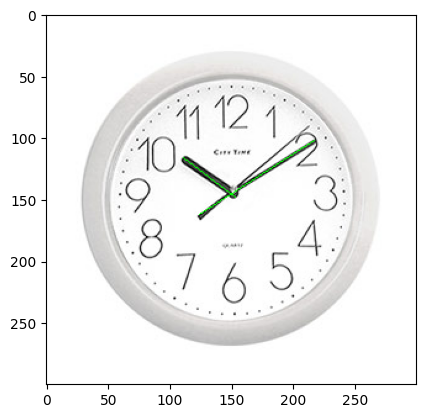

In [52]:
draw_img = image.copy()
for i in range(2):
    x1 = int(center[i][0])
    y1 = int(center[i][1])
    x2 = int(center[i][2])
    y2 = int(center[i][3])

    # Draw the lines:
    cv2.line(draw_img, (x1,y1), (x2,y2), (0,255,0), 1)

plt.imshow(draw_img[...,::-1], cmap='gray')

# HoughCircle

# <div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">پیدا کردن دایره با HoughCircle</div>

```HoughCircles(image, method, dp, minDist)```

```HoughCircles(image, method, dp, minDist, param1=?, param2=?, minRadius=?, maxRadius=?)```

With the arguments:

    image: Input image (grayscale).
    method: Define the detection method. Currently "HOUGH_GRADIENT" is the only one available in OpenCV.
    dp = 1: The inverse ratio of resolution.
    min_dist: Minimum distance between detected centers.
    param_1: Upper threshold for the internal Canny edge detector.
    param_2: Threshold for center detection.
    min_radius: Minimum radius to be detected. If unknown, put zero as default.
    max_radius: Maximum radius to be detected. If unknown, put zero as default.


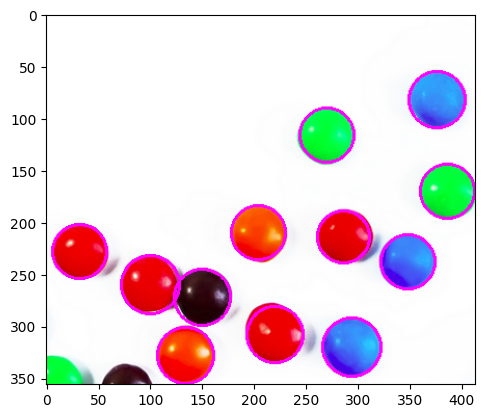

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread("images/smarties.png")
draw = img.copy()
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
row = img.shape[0]
circle = cv2.HoughCircles(gray,cv2.HOUGH_GRADIENT,dp=1,minDist=row/8, 
                          param1=100, param2=30
                          )
i = 0
if circle is not None:
    circles = np.uint16(np.around(circle))
    for i , c in enumerate(circles[0,:]):
        center_x,center_y ,redis = c
        i+=1
        cv2.circle(draw,(center_x,center_y),redis,(255,0,255),2)
plt.imshow(edge,cmap="gray")
plt.imshow(draw[...,::-1])

Number of coins: 7


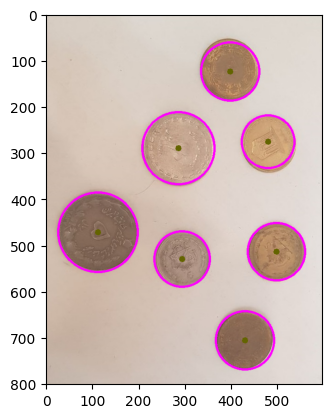

In [79]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Loads an image
src = cv2.imread("images/old-iranian-coins.jpg")
gray = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)
gray = cv2.medianBlur(gray, 5)

rows = gray.shape[0]
circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, rows / 8,
                           param1=100, param2=30)


if circles is not None:
    print("Number of coins:",len(circles[0,:]))
    circles = np.uint16(np.around(circles))
    for c in circles[0, :]:
        center_x,center_y, radius = c
        center = (center_x,center_y)
        cv2.circle(src, center, 3, (0, 100, 100), 5) #center
        cv2.circle(src, center, radius, (255, 0, 255), 3) #outline
plt.imshow(src[...,::-1]);

Number of coins: 24


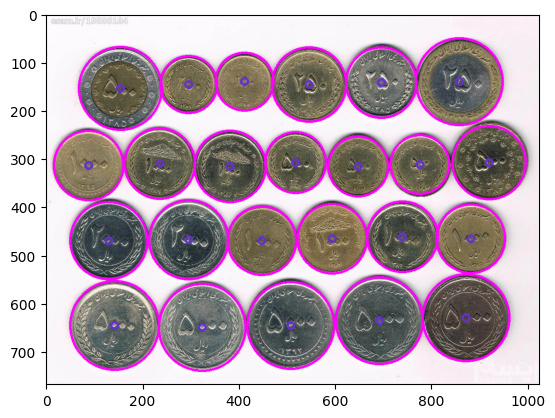

In [93]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Loads an image
src = cv2.imread("images/iranian-coin.jpg")
gray = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)
gray = cv2.medianBlur(gray, 5)

rows = gray.shape[0]
circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1, rows / 8,
                           param1=100, param2=30,
                           minRadius=50, maxRadius=100)


if circles is not None:
    circles = np.uint16(np.around(circles))
    for c in circles[0, :]:
        center_x,center_y, radius = c
        center = (center_x,center_y)
        cv2.circle(src, center, 7, (200, 50, 100), 3) #center
        cv2.circle(src, center, radius, (255, 0, 255), 3) #outline
plt.imshow(src[...,::-1])
print("Number of coins:",len(circles[0,:]))

### generalized hough transform for other shapes

# HDR

<div style="direction:rtl;text-align:right;font-family:B Lotus, B Nazanin, Tahoma">
تصویر برداری HDR که مخفف High-dynamic-range است تکنیکی است که در تصویربرداری و عکاسی برای تولید محدوده دینامیکی بیشتری از درخشندگی نسبت به روش‌های تصویربرداری دیجیتال استاندارد یا تکنیک‌های عکاسی استفاده می‌شود.
چشم انسان می‌تواند با طیف گسترده ای از شرایط نوری سازگار شود، در حالی‌که اکثر دستگاه های تصویربرداری از 8 بیت در هر کانال استفاده می کنند، بنابراین فقط به 256 سطح محدود می شویم.
وقتی از یک صحنه دنیای واقعی عکس می‌گیریم، مناطق روشن ممکن است بیش از حد نوردهی شوند، در حالی که مناطق تاریک ممکن است کم نوردهی شوند، بنابراین نمی‌توانیم با یک نوردهی همه جزئیات را ثبت کنیم. 
تصویربرداری HDR با تصاویری که از بیش از 8 بیت در هر کانال استفاده می‌کنند (معمولاً مقادیر شناور 32 بیتی) کار می‌کند که دامنه دینامیکی بسیار وسیع‌تری را امکان‌پذیر می‌کند.
</div>

[https://en.wikipedia.org/wiki/Multi-exposure_HDR_capture](https://en.wikipedia.org/wiki/Multi-exposure_HDR_capture)

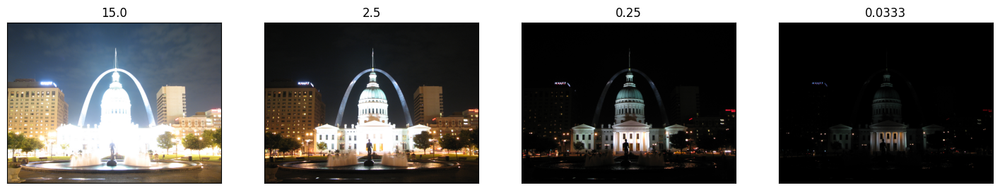

In [95]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Loading exposure images into a list
img_fn = ["images/img_15.jpg", "images/img_2.5.jpg", "images/img_0.25.jpg", "images/img_0.033.jpg"]
img_list = [cv2.imread(fn) for fn in img_fn]
exposure_times = np.array([15.0, 2.5, 0.25, 0.0333], dtype=np.float32)

# Show images
plt.figure(figsize=[18,4])
for i, (image, exposure) in enumerate(zip(img_list, exposure_times)):
    plt.subplot(1,4,i+1);plt.imshow(image[...,::-1]);plt.title(exposure);plt.xticks([]);plt.yticks([]);

## merge them

In [97]:
Mertens_exp = cv2.createMergeMertens()
res_Mertens = Mertens_exp.process(img_list)

## conver to 8 bit

In [99]:
res_Mertens_8_bit = np.clip(res_Mertens*255 , 0 ,255).astype(np.uint8)

## result

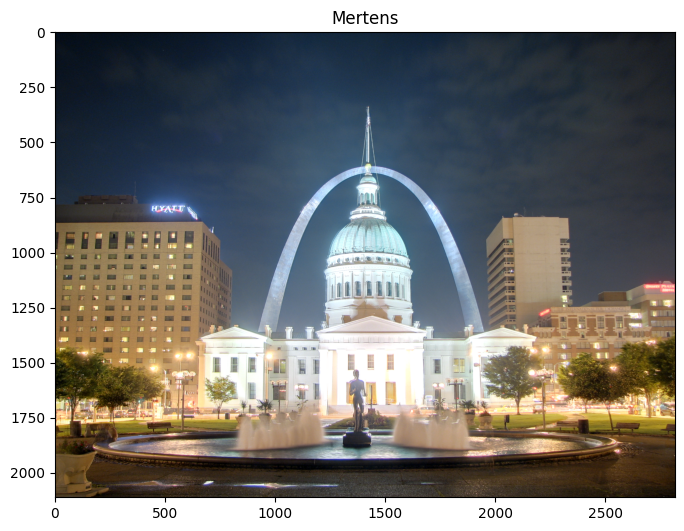

In [100]:
# Show images
plt.figure(figsize=[8,8])
plt.imshow(res_Mertens_8_bit[...,::-1]);plt.title("Mertens");

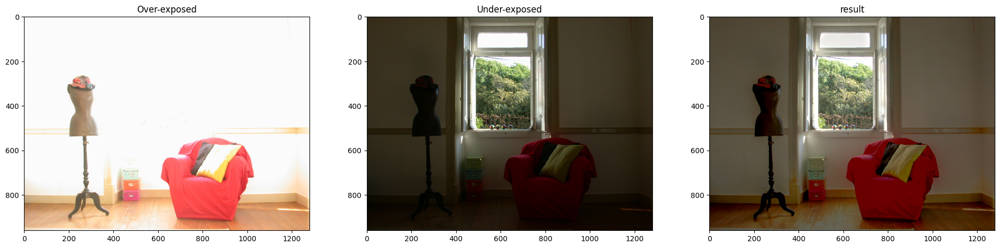

In [102]:
images = ['images/1280px-HDRI_Sample_Scene_Window_-_10.jpg','images/1280px-HDRI_Sample_Scene_Window_-_05.jpg']
img_list = [cv2.imread(fn) for fn in images]
# Exposure fusion using Mertens
merge_mertens = cv2.createMergeMertens()
res_mertens = merge_mertens.process(img_list)
# Convert datatype to 8-bit and save
res_mertens_8bit = np.clip(res_mertens*255, 0, 255).astype('uint8')
# Show images
plt.figure(figsize=[24,8])
plt.subplot(1,3,1);plt.imshow(img_list[0][...,::-1]);plt.title("Over-exposed");
plt.subplot(1,3,2);plt.imshow(img_list[1][...,::-1]);plt.title("Under-exposed");
plt.subplot(1,3,3);plt.imshow(res_mertens_8bit[...,::-1]);plt.title("result");

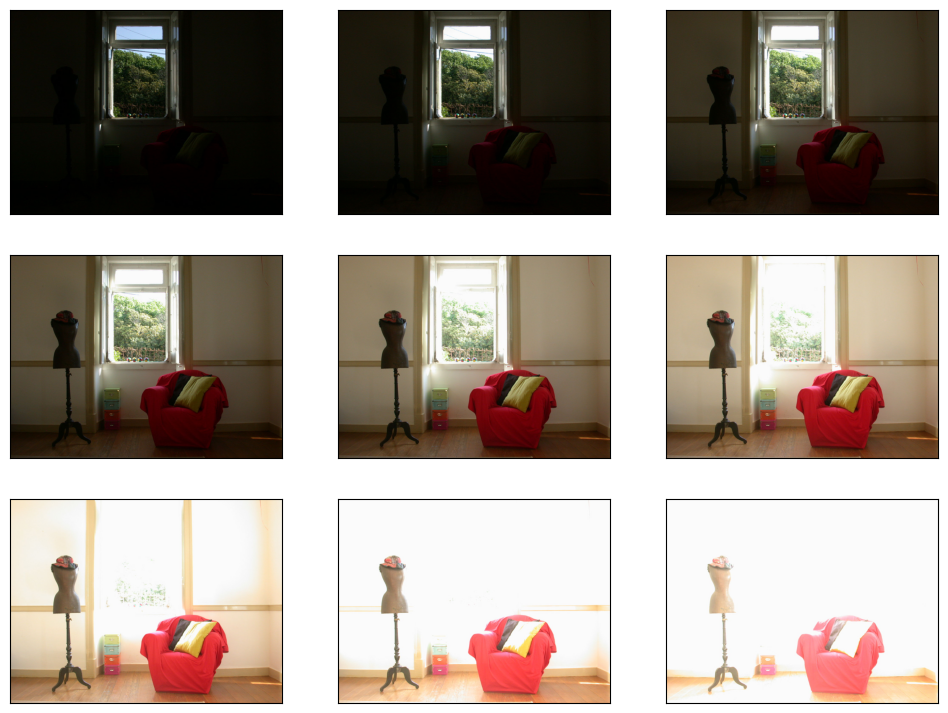

In [103]:
import glob
images = glob.glob('images/1280px-HDRI_Sample_Scene_Window_-*.jpg')
img_list = [cv2.imread(fn) for fn in images]
# Show images
plt.figure(figsize=[12,9])
for i, image in enumerate(img_list):
    plt.subplot(3,3,i+1);plt.imshow(image[...,::-1]);plt.xticks([]);plt.yticks([]);

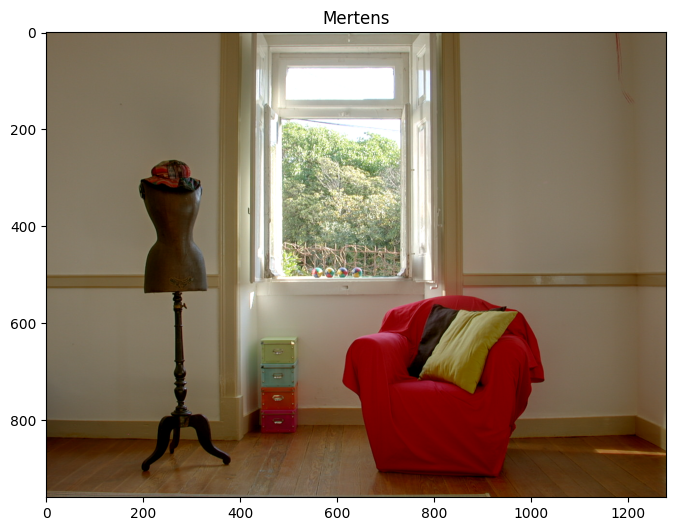

In [104]:
# Exposure fusion using Mertens
merge_mertens = cv2.createMergeMertens()
res_mertens = merge_mertens.process(img_list)
# Convert datatype to 8-bit and save
res_mertens_8bit = np.clip(res_mertens*255, 0, 255).astype('uint8')
# Show images
plt.figure(figsize=[8,8])
plt.imshow(res_mertens_8bit[...,::-1]);plt.title("Mertens");

**More information:**

https://www.youtube.com/watch?v=95DNdbxaIXE

https://docs.opencv.org/3.4/d2/df0/tutorial_py_hdr.html

https://learnopencv.com/high-dynamic-range-hdr-imaging-using-opencv-cpp-python/

## for shaking of images you should know upper

# Seamless Cloning

In [106]:
def combine_two_color_images(image1, image2):

    foreground, background = image1.copy(), image2.copy()
    
    foreground_height = foreground.shape[0]
    foreground_width = foreground.shape[1]
    alpha =0.5
    
    # do composite on the upper-left corner of the background image.
    blended_portion = cv2.addWeighted(foreground,
                alpha,
                background[:foreground_height,:foreground_width,:],
                1 - alpha,
                0,
                background)
    background[:foreground_height,:foreground_width,:] = blended_portion
    return background

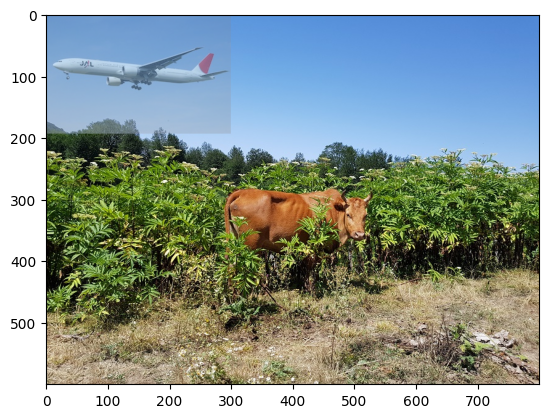

In [107]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read images
src = cv2.imread("images/airplane.jpg")
dst = cv2.imread("images/input.jpg")
result = combine_two_color_images(src, dst)
plt.imshow(result[...,::-1])

Seamless cloning in OpenCV is an implementation of an influential SIGGRAPH 2003 paper titled “Poisson Image Editing”, by Patrick Perez, Michel Gangnet, and Andrew Blake.

[siggraph_perez.pdf(2013)](http://www.irisa.fr/vista/Papers/2003_siggraph_perez.pdf)

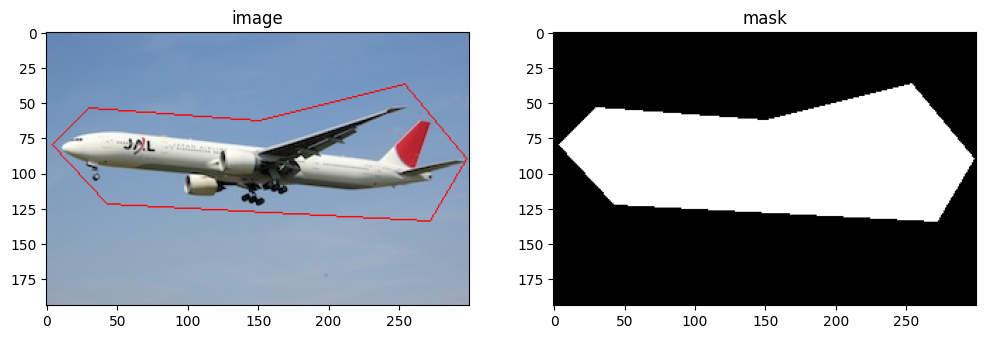

In [108]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

src = cv2.imread("images/airplane.jpg")
poly = np.array([ [4,80], [30,54], [151,63], [254,37], [298,90], [272,134], [43,122] ], np.int32)
cv2.polylines(src, [poly],1, (0, 0, 255))

src_mask = np.zeros(src.shape, src.dtype)
cv2.fillPoly(src_mask, [poly], (255, 255, 255))


plt.figure(figsize=[12,7])
plt.subplot(121);plt.imshow(src[...,::-1]);plt.title("image");
plt.subplot(122);plt.imshow(src_mask[...,::-1]);plt.title("mask");

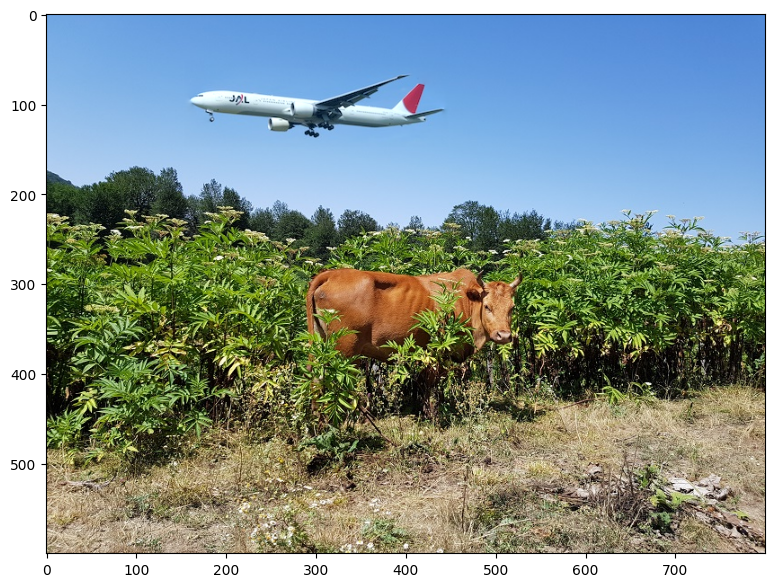

In [110]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read images
src = cv2.imread("images/airplane.jpg")
dst = cv2.imread("images/input.jpg")

# Create a rough mask around the airplane.
src_mask = np.zeros(src.shape, src.dtype)
poly = np.array([ [4,80], [30,54], [151,63], [254,37], [298,90], [272,134], [43,122] ], np.int32)
cv2.fillPoly(src_mask, [poly], (255, 255, 255))

# This is where the CENTER of the airplane will be placed
center = (300,100)

# Clone seamlessly.
output = cv2.seamlessClone(src, dst, src_mask, center, cv2.NORMAL_CLONE)

plt.figure(figsize=[12,7])
plt.imshow(output[...,::-1])

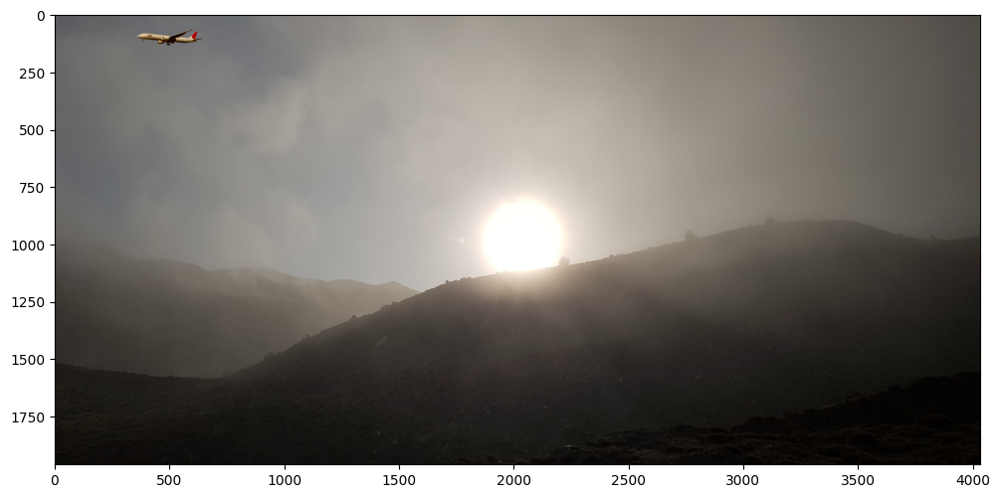

In [112]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read images
src = cv2.imread("images/airplane.jpg")
dst = cv2.imread("images/aa.jpg")

# Create a rough mask around the airplane.
src_mask = np.zeros(src.shape, src.dtype)
poly = np.array([ [4,80], [30,54], [151,63], [254,37], [298,90], [272,134], [43,122] ], np.int32)
cv2.fillPoly(src_mask, [poly], (255, 255, 255))

# This is where the CENTER of the airplane will be placed
center = (500,100)

# Clone seamlessly.
output = cv2.seamlessClone(src, dst, src_mask, center, cv2.NORMAL_CLONE)

plt.figure(figsize=[12,7])
plt.imshow(output[...,::-1])

## compare Mixed , Normal

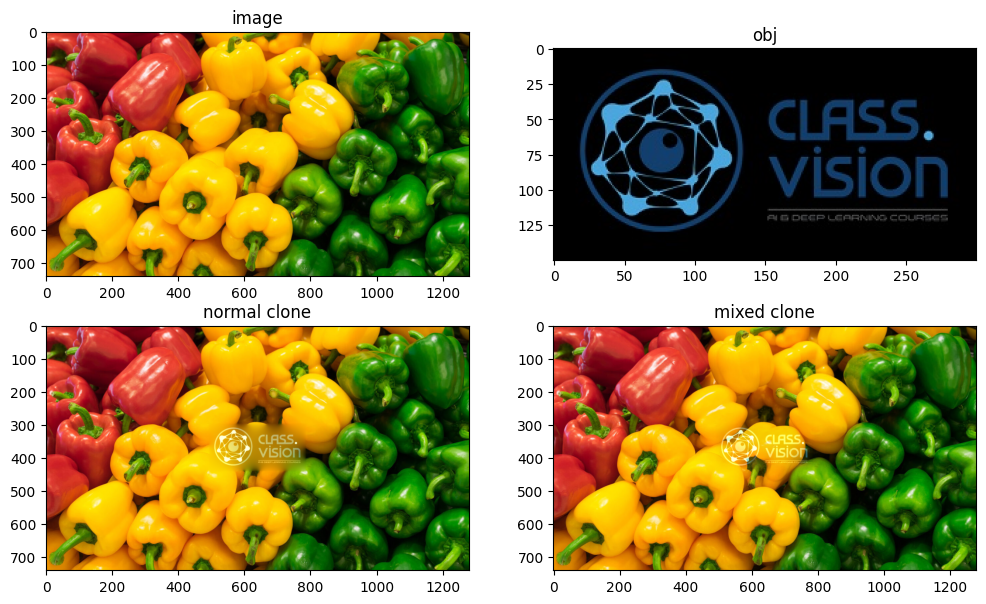

In [113]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read images : src image will be cloned into dst
im = cv2.imread("images/felfel-dolme.jpg")
obj= cv2.imread("images/class.vision.jpg")

# Create an all white mask
mask = 255 * np.ones(obj.shape, obj.dtype)

# The location of the center of the src in the dst
width, height, channels = im.shape
center = (int(height/2), int(width/2))

# Seamlessly clone src into dst and put the results in output
normal_clone = cv2.seamlessClone(obj, im, mask, center, cv2.NORMAL_CLONE)
mixed_clone = cv2.seamlessClone(obj, im, mask, center, cv2.MIXED_CLONE)

plt.figure(figsize=[12,7])
plt.subplot(221);plt.imshow(im[...,::-1]);plt.title("image");
plt.subplot(222);plt.imshow(obj[...,::-1]);plt.title("obj");
plt.subplot(223);plt.imshow(normal_clone[...,::-1]);plt.title("normal clone");
plt.subplot(224);plt.imshow(mixed_clone[...,::-1]);plt.title("mixed clone");

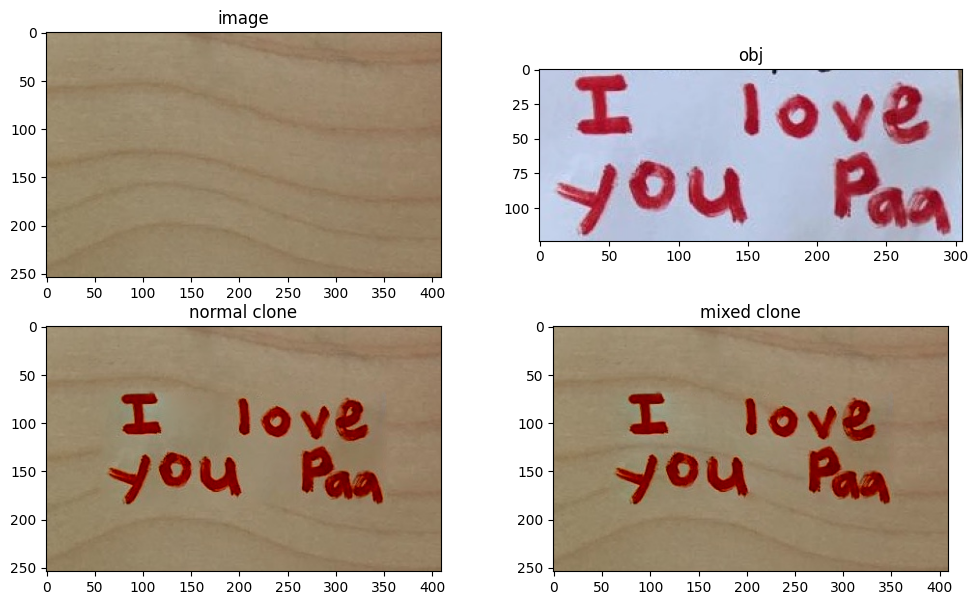

In [114]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read images : src image will be cloned into dst
im = cv2.imread("images/wood-texture.jpg")
obj= cv2.imread("images/iloveyouticket.jpg")

# Create an all white mask
mask = 255 * np.ones(obj.shape, obj.dtype)

# The location of the center of the src in the dst
width, height, channels = im.shape
center = (int(height/2), int(width/2))

# Seamlessly clone src into dst and put the results in output
normal_clone = cv2.seamlessClone(obj, im, mask, center, cv2.NORMAL_CLONE)
mixed_clone = cv2.seamlessClone(obj, im, mask, center, cv2.MIXED_CLONE)

plt.figure(figsize=[12,7])
plt.subplot(221);plt.imshow(im[...,::-1]);plt.title("image");
plt.subplot(222);plt.imshow(obj[...,::-1]);plt.title("obj");
plt.subplot(223);plt.imshow(normal_clone[...,::-1]);plt.title("normal clone");
plt.subplot(224);plt.imshow(mixed_clone[...,::-1]);plt.title("mixed clone");

https://learnopencv.com/seamless-cloning-using-opencv-python-cpp/


# inpainting

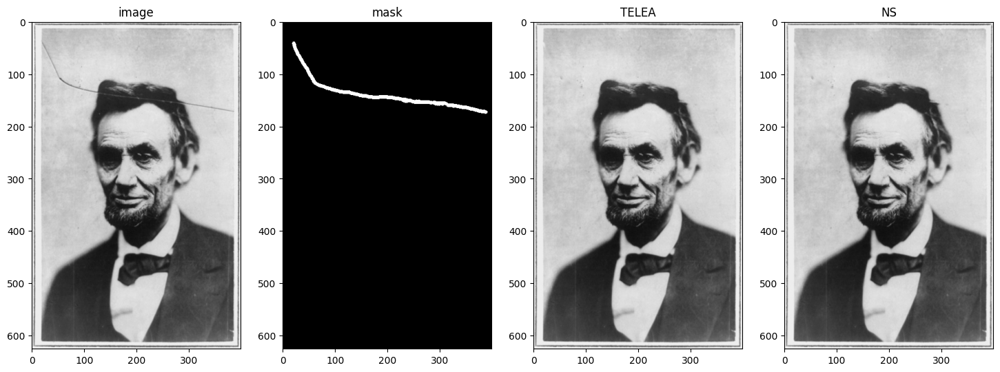

In [116]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

image = cv2.imread("images/Lincoln.jpg")
mask = cv2.imread("images/inpaintMask.png",0) #single channel
res_telea = cv2.inpaint(src=image, inpaintMask=mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)
res_ns = cv2.inpaint(src=image, inpaintMask=mask, inpaintRadius=3, flags=cv2.INPAINT_NS)


plt.figure(figsize=[18,7])
plt.subplot(141);plt.imshow(image[...,::-1]);plt.title("image");
plt.subplot(142);plt.imshow(mask, cmap='gray');plt.title("mask");
plt.subplot(143);plt.imshow(res_telea[...,::-1]);plt.title("TELEA");
plt.subplot(144);plt.imshow(res_ns[...,::-1]);plt.title("NS");

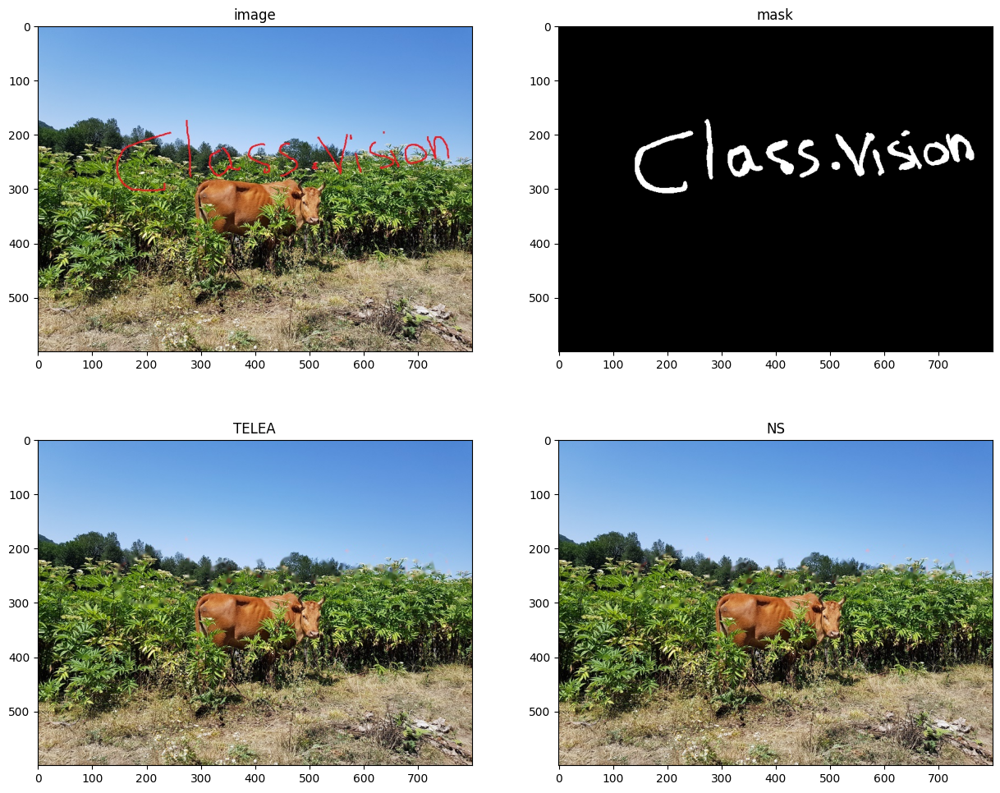

In [119]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

image = cv2.imread("images/input-inpaint.jpg")
mask = cv2.imread("images/input_inpaintMask.png",0) #single channel

res_telea = cv2.inpaint(src=image, inpaintMask=mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)
res_ns = cv2.inpaint(src=image, inpaintMask=mask, inpaintRadius=3, flags=cv2.INPAINT_NS)


plt.figure(figsize=[15,12])
plt.subplot(221);plt.imshow(image[...,::-1]);plt.title("image");
plt.subplot(222);plt.imshow(mask, cmap='gray');plt.title("mask");
plt.subplot(223);plt.imshow(res_telea[...,::-1]);plt.title("TELEA");
plt.subplot(224);plt.imshow(res_ns[...,::-1]);plt.title("NS");

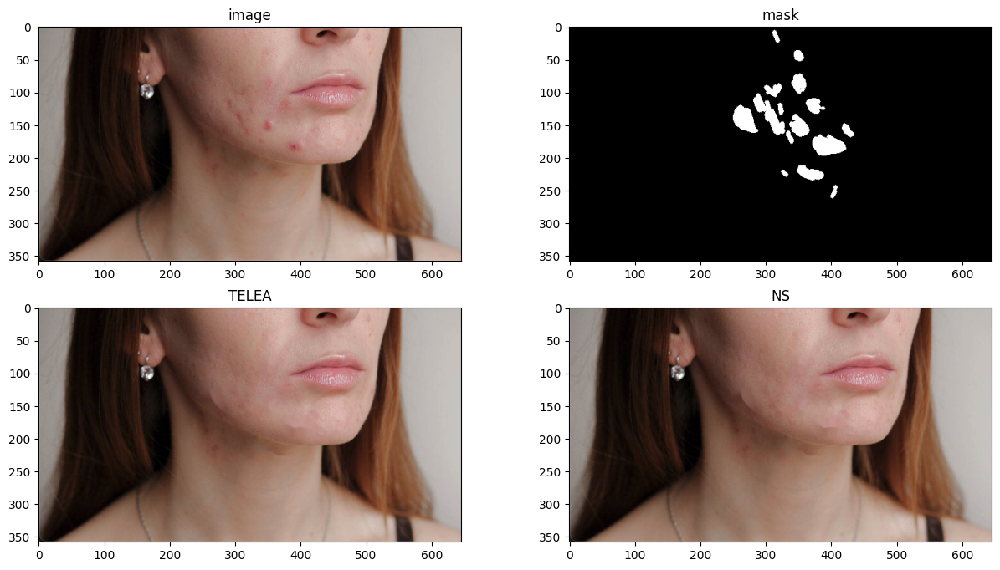

In [120]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

image = cv2.imread("images/blemish.png")
mask = cv2.imread("images/blemishMask.png",0) #single channel

res_telea = cv2.inpaint(src=image, inpaintMask=mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)
res_ns = cv2.inpaint(src=image, inpaintMask=mask, inpaintRadius=3, flags=cv2.INPAINT_NS)


plt.figure(figsize=[15,8])
plt.subplot(221);plt.imshow(image[...,::-1]);plt.title("image");
plt.subplot(222);plt.imshow(mask, cmap='gray');plt.title("mask");
plt.subplot(223);plt.imshow(res_telea[...,::-1]);plt.title("TELEA");
plt.subplot(224);plt.imshow(res_ns[...,::-1]);plt.title("NS");

In [121]:
import numpy as np
import cv2 as cv

# OpenCV Utility Class for Mouse Handling
class Sketcher:
    def __init__(self, windowname, dests, colors_func):
        self.prev_pt = None
        self.windowname = windowname
        self.dests = dests
        self.colors_func = colors_func
        self.dirty = False
        self.show()
        cv.setMouseCallback(self.windowname, self.on_mouse)

    def show(self):
        cv.imshow(self.windowname, self.dests[0])
        cv.imshow(self.windowname + ": mask", self.dests[1])

    # onMouse function for Mouse Handling
    def on_mouse(self, event, x, y, flags, param):
        pt = (x, y)
        if event == cv.EVENT_LBUTTONDOWN:
            self.prev_pt = pt
        elif event == cv.EVENT_LBUTTONUP:
            self.prev_pt = None

        if self.prev_pt and flags & cv.EVENT_FLAG_LBUTTON:
            for dst, color in zip(self.dests, self.colors_func()):
                cv.line(dst, self.prev_pt, pt, color, 5)
            self.dirty = True
            self.prev_pt = pt
            self.show()


# Read image in color mode
img = cv.imread("images/blemish.png", cv.IMREAD_COLOR)

# Create a copy of original image
img_mask = img.copy()
# Create a black copy of original image
# Acts as a mask
inpaintMask = np.zeros(img.shape[:2], np.uint8)
# Create sketch using OpenCV Utility Class: Sketcher
sketch = Sketcher('image', [img_mask, inpaintMask], lambda : ((255, 255, 255), 255))

while True:
    ch = cv.waitKey()
    if ch == 27:
        break
    if ch == ord('t'):
        # Use Algorithm proposed by Alexendra Telea: Fast Marching Method (2004)
        # Reference: https://pdfs.semanticscholar.org/622d/5f432e515da69f8f220fb92b17c8426d0427.pdf
        res = cv.inpaint(src=img_mask, inpaintMask=inpaintMask, inpaintRadius=3, flags=cv.INPAINT_TELEA)
        cv.imshow('Inpaint Output using FMM', res)
    if ch == ord('n'):
        # Use Algorithm proposed by Bertalmio, Marcelo, Andrea L. Bertozzi, and Guillermo Sapiro: Navier-Stokes, Fluid Dynamics, and Image and Video Inpainting (2001)
        res = cv.inpaint(src=img_mask, inpaintMask=inpaintMask, inpaintRadius=3, flags=cv.INPAINT_NS)
        cv.imshow('Inpaint Output using NS Technique', res)
    if ch == ord('r'):
        img_mask[:] = img
        inpaintMask[:] = 0
        sketch.show()

print('Completed')
cv.destroyAllWindows()
cv2.imwrite("inpaintMask.png",inpaintMask)

Completed


True

# illumination-change

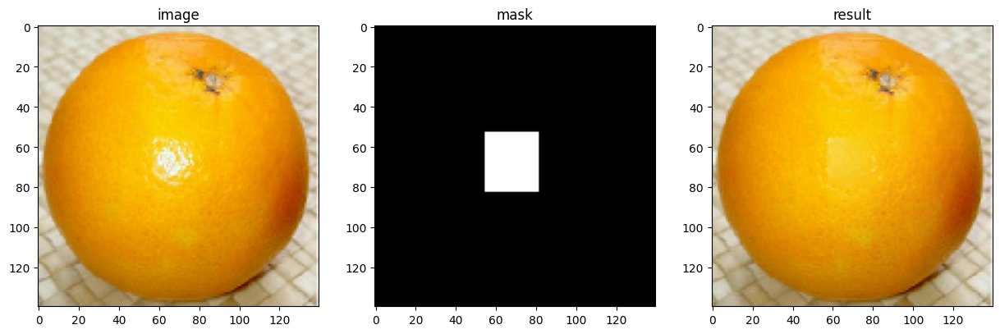

In [122]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

src = cv2.imread("images/orange.png")
mask = cv2.imread("images/orange-mask.png") #single channel

result = cv2.illuminationChange(src, mask);


plt.figure(figsize=[15,12])
plt.subplot(131);plt.imshow(src[...,::-1]);plt.title("image");
plt.subplot(132);plt.imshow(mask, cmap='gray');plt.title("mask");
plt.subplot(133);plt.imshow(result[...,::-1]);plt.title("result");
